# Doctr Line Algorithm 

In [59]:
!pip install python-doctr[viz] opencv-python numpy
!pip install pytesseract

## DocTR OCR

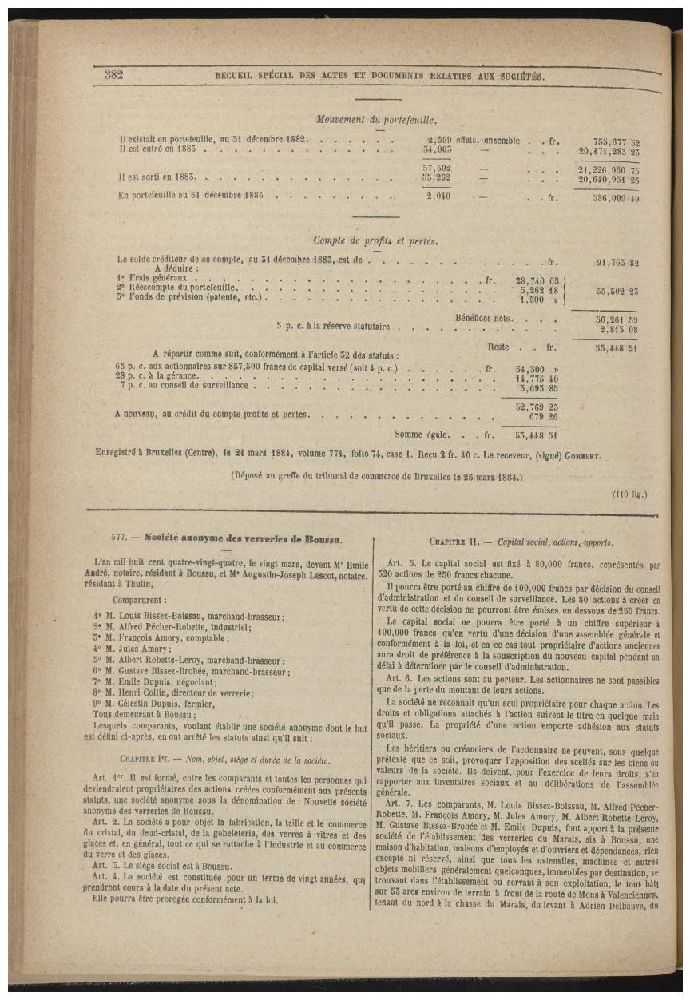

In [167]:
import cv2 as cv
import numpy as np
from doctr.models import detection_predictor
import matplotlib.pyplot as plt

image = cv.imread("/home/bas/Documents/Visual Code Repo's/BelHisFirm-BelHisHAAI/experiments/test/test-Yves_026_None.png", cv.IMREAD_COLOR)

plt.figure(figsize=(16, 16))
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


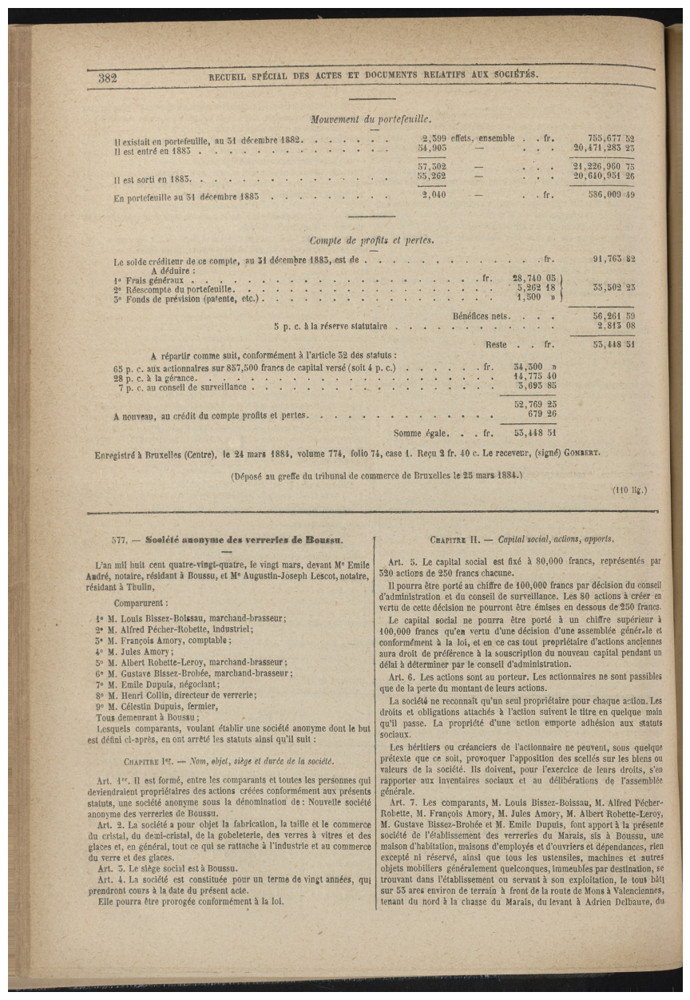

In [168]:
def warp_function(image):
    gray = image if image.ndim == 2 else cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    edges = cv.Canny(gray, 50, 150, apertureSize=3)
    lines = cv.HoughLinesP(edges, 1, np.pi/180, threshold=100,
                           minLineLength=100, maxLineGap=10)

    angles = []
    if lines is not None:
        for x1, y1, x2, y2 in lines[:, 0, :]:
            angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))
            angles.append(angle)

    if not angles:
        return image

    median_angle = float(np.median(angles))

    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, median_angle, 1.0).astype(np.float32)

    rotated = cv.warpAffine(
        image, M, (w, h),
        flags=cv.INTER_CUBIC,
        borderMode=cv.BORDER_REPLICATE
    )
    return rotated

image = warp_function(image)

plt.figure(figsize=(16, 16))
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [219]:
model = detection_predictor('db_resnet50', pretrained=True, assume_straight_pages=False, preserve_aspect_ratio=True)

out = model([image])
words_array = out[0]['words']

## line algorithm

In [ ]:
from statistics import median
import matplotlib.pyplot as plt


for i, box in enumerate(words_array):
    
    # Extract these pairs, I think the others can work to
    x1 = box[0][0]
    y1 = box[0][1]
    x2 = box[2][0]
    y2 = box[2][1]

    bbox_list = [
        (box[0][0], box[0][1], box[2][0], box[2][1])
        for box in words_array
    ]

# Clamp
def clamp_box(x0, y0, x1, y1):
    x0, x1 = sorted([x0, x1])
    y0, y1 = sorted([y0, y1])
    return x0, y0, x1, y1


# Purge to small boxes 
bbox_list = [box for box in bbox_list if (box[2] - box[0]) > 0.01 or (box[3] - box[1]) > 0.01]

# Clamp bounding boxes to image dimensions
bbox_list = [clamp_box(x0, y0, x1, y1) for (x0, y0, x1, y1) in bbox_list]

# Sort bbox words in lines

bbox_list.sort(key=lambda b: (0.5*(b[1]+b[3]), b[0])) 


def vert_iou_calc(bbox1, bbox2):
    x1, y1, x2, y2 = bbox1
    x3, y3, x4, y4 = bbox2

    if x1 <= x3 and x2 >= x4 and y1 <= y3 and y2 >= y4:
        return 1.0
    else:
        inter_w = max(0.0, 0.1)
        inter_h = max(0.0, min(y2, y4) - max(y1, y3))

        inter = inter_w * inter_h

        area_a = max(0.0, (0.1) * max(0.0, (y2 - y1)))
        area_b = max(0.0, (0.1) * max(0.0, (y4 - y3)))

        union = area_a + area_b - inter

        return inter / union 

    
# Group words into lines based on y1
line_bbox_list = []

def resolve_bbox(bbox1, bbox2):

    # BBOX 1 should be the most left one, spatially speaking
    
    x1, y1, x2, y2 = bbox1
    x3, y3, x4, y4 = bbox2

    # Calculate the new bounding box that encompasses both
    # Assumes input format is left corner_bottom, right_corner_top
    bbox3 = (min(x1, x3), min(y1, y3), max(x2, x4), max(y2, y4))


    return bbox3

print("First pass")

# Calculate lines based on bounding boxes
for idx, bbox in enumerate(bbox_list):
    if idx > 0:
        iou = vert_iou_calc(line, bbox)
        if iou > 0.5: 
            line = resolve_bbox(line, bbox)
        else:
            line_bbox_list.append(line)
            line = bbox
    else:
        line = bbox
    if idx == len(bbox_list) - 1:
        line_bbox_list.append(line)

print("Done")

First pass
Done


# Viz

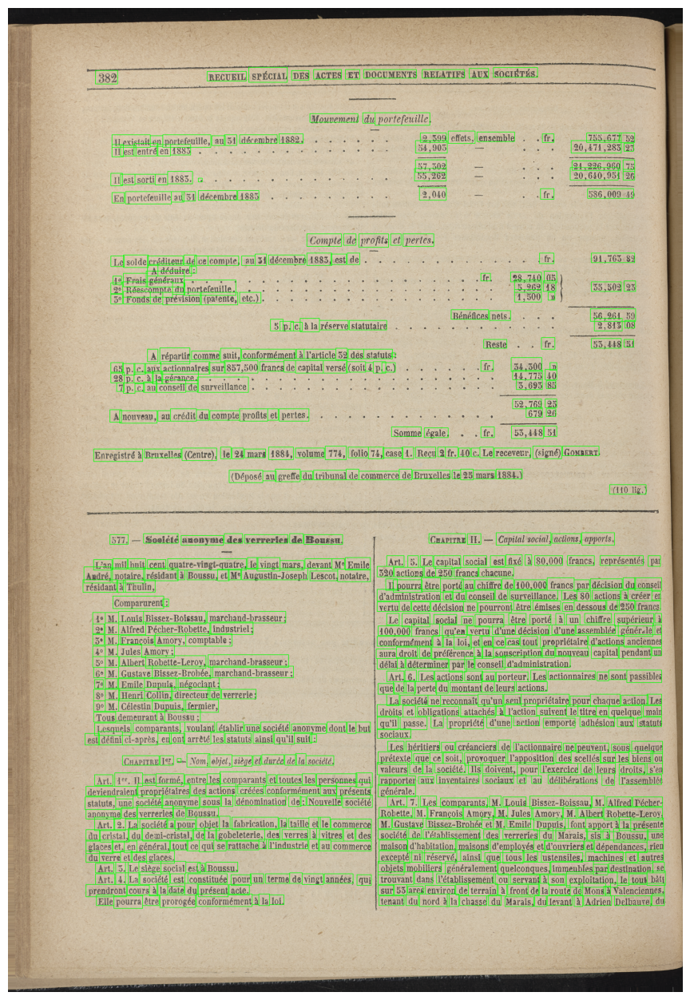

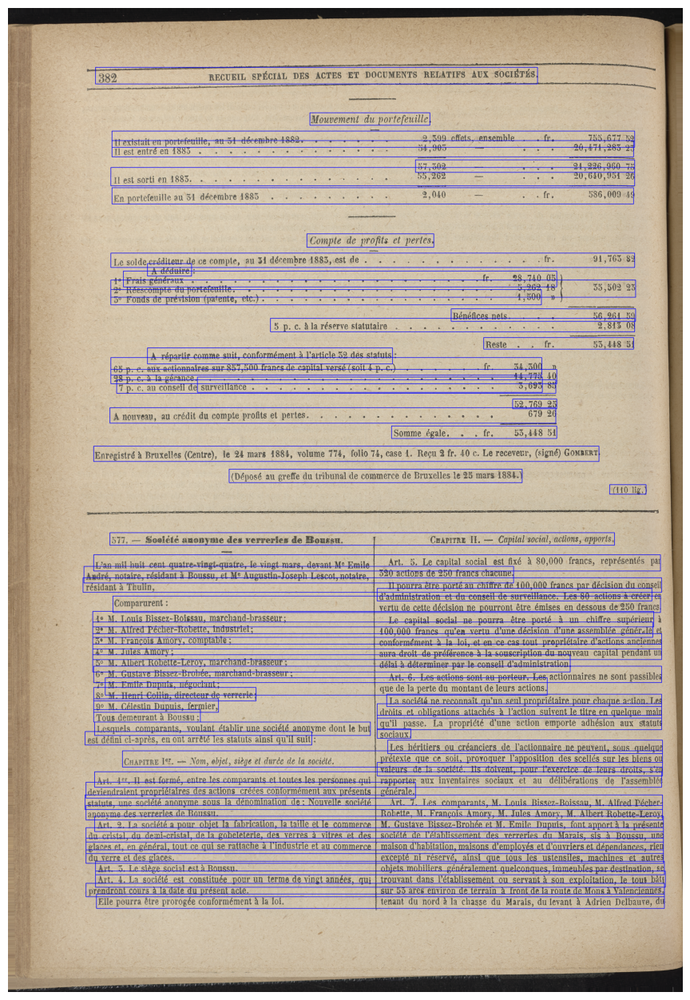

In [285]:
image_crop = image.copy()
image_line = image.copy()

for i, box in enumerate(words_array):
    
    # Extract these pairs, I think the others can work to
    x1 = box[0][0]
    y1 = box[0][1]
    x2 = box[2][0]
    y2 = box[2][1]

    # Normalization
    h, w = image.shape[:2]
    pt1 = (int(x1 * w), int(y1 * h))
    pt2 = (int(x2 * w), int(y2 * h))
    cv.rectangle(image_crop, pt1, pt2, (0, 255, 0), 2)

plt.figure(figsize=(16, 16))
plt.imshow(cv.cvtColor(image_crop, cv.COLOR_BGR2RGB))
plt.axis('off')
#plt.show()

for line in line_bbox_list:
    pt1 = (int(line[0] * image.shape[1]), int(line[1] * image.shape[0]))
    pt2 = (int(line[2] * image.shape[1]), int(line[3] * image.shape[0]))
    cv.rectangle(image_line, pt1, pt2, (255, 0, 0), 2)
plt.figure(figsize=(16, 16))
plt.imshow(cv.cvtColor(image_line, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Lines

(np.float64(0.12979329652450844), np.float64(0.060273297131061554), np.float64(0.7847743872888396), np.float64(0.0771484375))


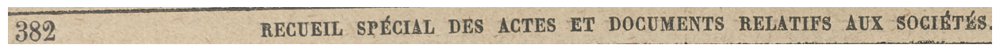

(np.float64(0.44731673835156466), np.float64(0.1064453125), np.float64(0.6253007304070894), np.float64(0.119140625))


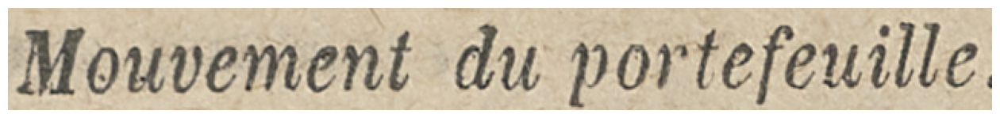

(np.float64(0.1539991194440598), np.float64(0.125), np.float64(0.9285854528697037), np.float64(0.1416015625))


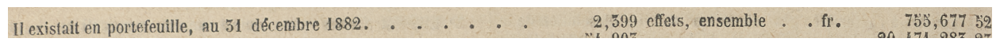

(np.float64(0.1539991194440598), np.float64(0.134765625), np.float64(0.9271615809332595), np.float64(0.1513671875))


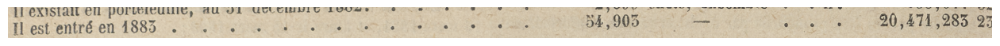

(np.float64(0.6039426513604265), np.float64(0.154296875), np.float64(0.9285854528697037), np.float64(0.1669921875))


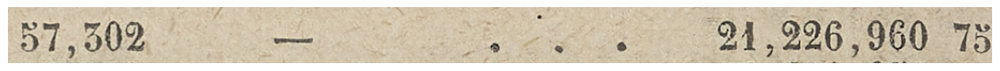

(np.float64(0.15257524750761564), np.float64(0.162109375), np.float64(0.9285854528697037), np.float64(0.1806640625))


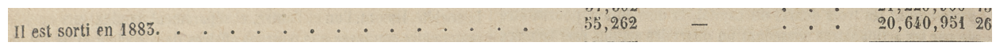

(np.float64(0.1539991194440598), np.float64(0.1826171875), np.float64(0.9271615809332595), np.float64(0.19921875))


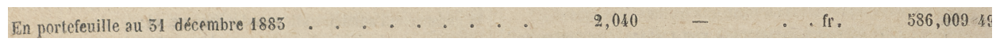

(np.float64(0.44304512254223205), np.float64(0.2294921875), np.float64(0.6309962181528662), np.float64(0.2431640625))


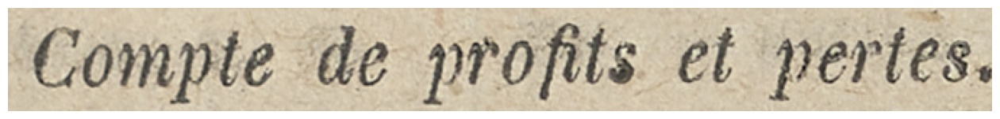

(np.float64(0.15257524750761564), np.float64(0.2490234375), np.float64(0.9285854528697037), np.float64(0.263671875))


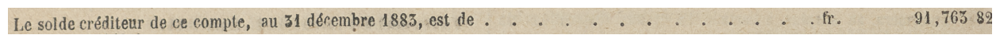

(np.float64(0.20668238109249515), np.float64(0.259765625), np.float64(0.2721804901689283), np.float64(0.2724609375))


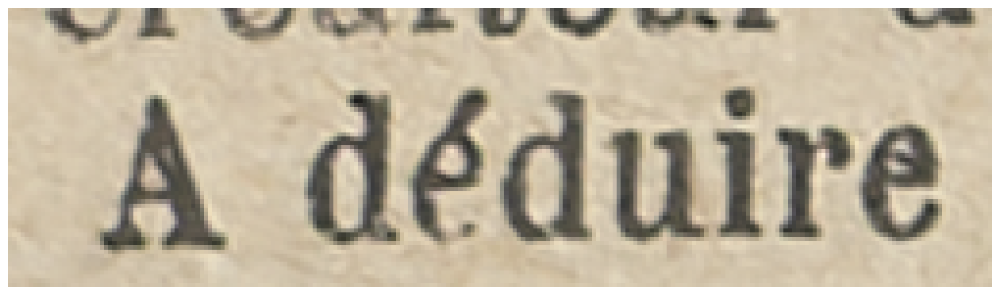

(np.float64(0.17108558268139018), np.float64(0.2673083543777466), np.float64(0.8132518260177236), np.float64(0.2834729552268982))


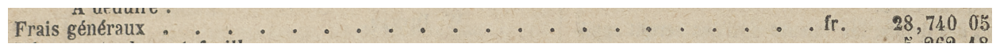

(np.float64(0.15257524750761564), np.float64(0.2763671875), np.float64(0.9300093248061478), np.float64(0.2939453125))


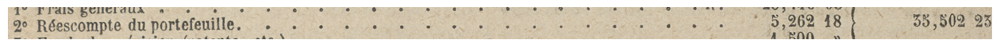

(np.float64(0.15257524750761564), np.float64(0.2861328125), np.float64(0.7904698750346164), np.float64(0.3017578125))


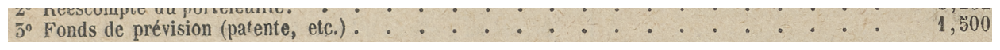

(np.float64(0.6566259130088619), np.float64(0.3056640625), np.float64(0.9300093248061478), np.float64(0.318359375))


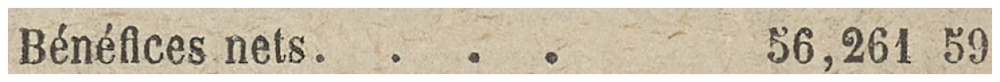

(np.float64(0.38893798895735254), np.float64(0.3154296875), np.float64(0.9285854528697037), np.float64(0.3291015625))


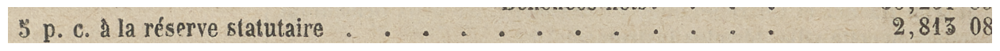

(np.float64(0.7050375588479645), np.float64(0.3349609375), np.float64(0.9271615809332595), np.float64(0.3466796875))


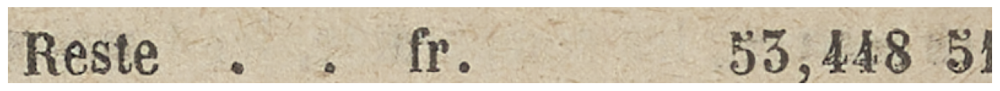

(np.float64(0.20668238109249515), np.float64(0.3453596830368042), np.float64(0.5697697248857657), np.float64(0.3616716265678406))


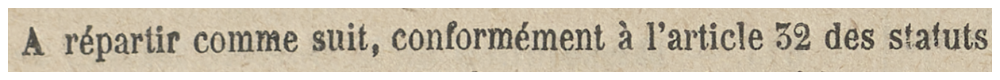

(np.float64(0.15257524750761564), np.float64(0.35521602630615234), np.float64(0.7909889660426963), np.float64(0.373046875))


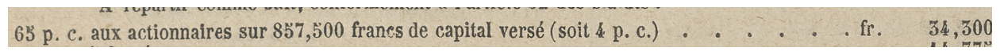

(np.float64(0.15257524750761564), np.float64(0.3671875), np.float64(0.8132518260177236), np.float64(0.3818359375))


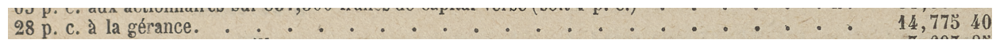

(np.float64(0.28072372178759347), np.float64(0.375), np.float64(0.7918937469710606), np.float64(0.390625))


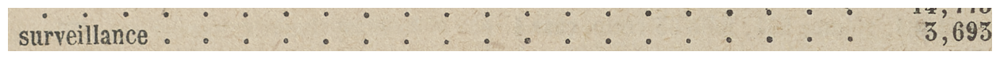

(np.float64(0.1611184791262808), np.float64(0.3779296875), np.float64(0.8118279540812794), np.float64(0.3916015625))


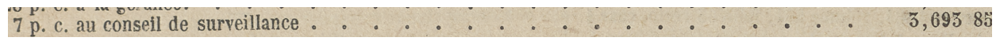

(np.float64(0.7477537169412904), np.float64(0.3974609375), np.float64(0.8132518260177236), np.float64(0.4072265625))


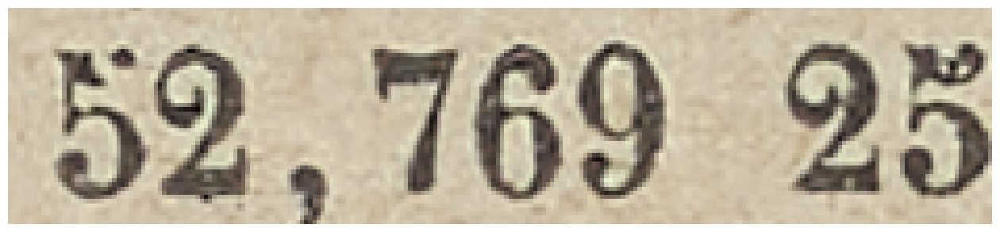

(np.float64(0.15115137557117142), np.float64(0.40625), np.float64(0.8118279540812794), np.float64(0.421875))


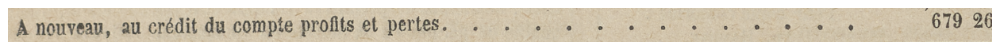

(np.float64(0.5683458529493215), np.float64(0.4248046875), np.float64(0.8132518260177236), np.float64(0.4375))


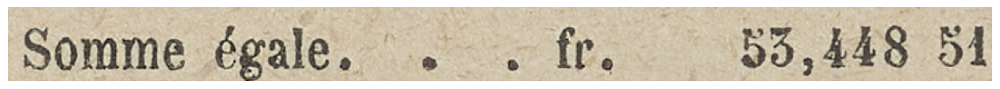

(np.float64(0.12694555265162005), np.float64(0.4453125), np.float64(0.8759021912212683), np.float64(0.4609375))


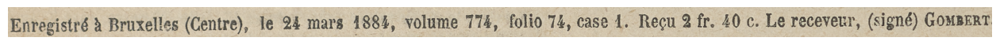

(np.float64(0.32771149569025204), np.float64(0.46875), np.float64(0.7619924363057324), np.float64(0.482421875))


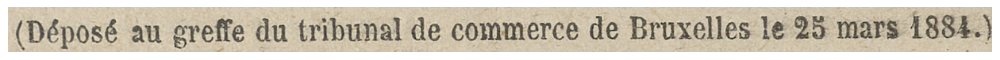

(np.float64(0.8915647825221545), np.float64(0.484375), np.float64(0.945671916107034), np.float64(0.494140625))


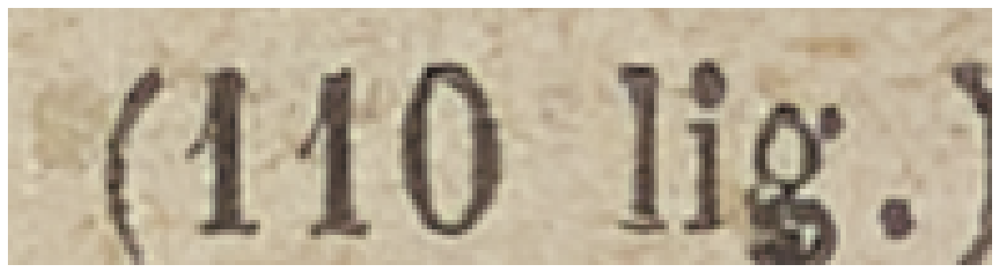

(np.float64(0.15115137557117142), np.float64(0.533203125), np.float64(0.8986841422043755), np.float64(0.5458984375))


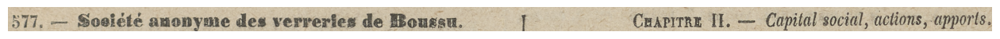

(np.float64(0.12694555265162005), np.float64(0.5556640625), np.float64(0.967029995153697), np.float64(0.572265625))


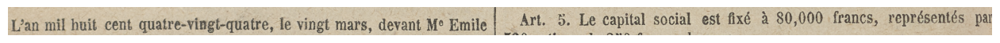

(np.float64(0.11255648548138897), np.float64(0.5673828125), np.float64(0.7491775888777347), np.float64(0.5843662619590759))


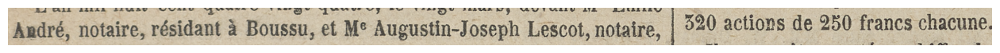

(np.float64(0.11128296135073384), np.float64(0.5791015625), np.float64(0.9684538670901413), np.float64(0.59375))


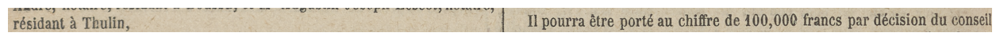

(np.float64(0.5469877739026585), np.float64(0.58984375), np.float64(0.9542151477256993), np.float64(0.6025390625))


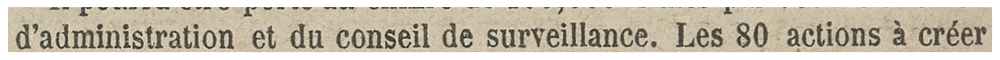

(np.float64(0.15542299138050403), np.float64(0.59765625), np.float64(0.967029995153697), np.float64(0.6142578125))


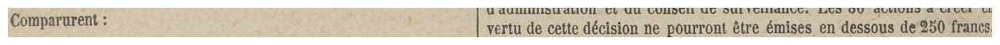

(np.float64(0.12552168071517583), np.float64(0.61328125), np.float64(0.9570628915985877), np.float64(0.62890625))


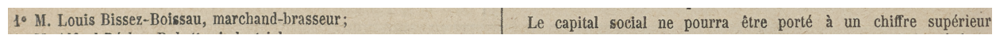

(np.float64(0.12552168071517583), np.float64(0.6240234375), np.float64(0.9556390196621434), np.float64(0.6396484375))


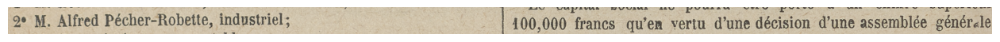

(np.float64(0.12552168071517583), np.float64(0.6357421875), np.float64(0.9684538670901413), np.float64(0.6513671875))


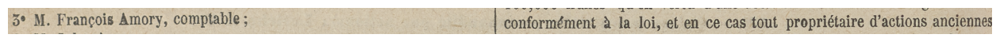

(np.float64(0.12552168071517583), np.float64(0.646484375), np.float64(0.9684538670901413), np.float64(0.662109375))


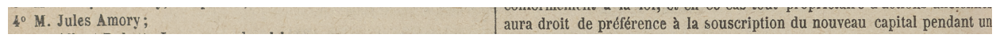

(np.float64(0.12552168071517583), np.float64(0.6571768522262573), np.float64(0.8331860331279424), np.float64(0.6748046875))


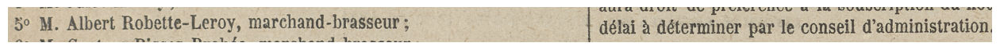

(np.float64(0.12694555265162005), np.float64(0.6689453125), np.float64(0.9684538670901413), np.float64(0.685546875))


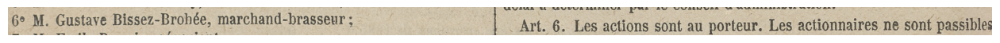

(np.float64(0.14403201588895043), np.float64(0.6806640625), np.float64(0.7990131066532816), np.float64(0.6982421875))


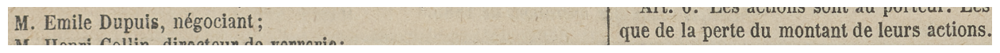

(np.float64(0.12694555265162005), np.float64(0.6904296875), np.float64(0.36757990991068956), np.float64(0.7041015625))


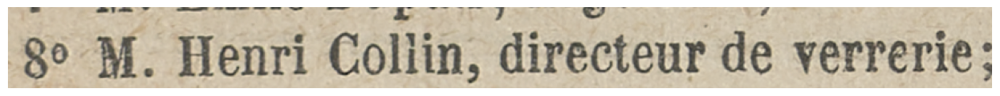

(np.float64(0.5612264932671005), np.float64(0.697265625), np.float64(0.9684538670901413), np.float64(0.7099609375))


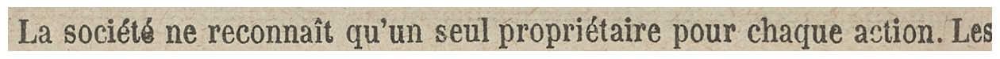

(np.float64(0.12694555265162005), np.float64(0.7021484375), np.float64(0.31204890438936583), np.float64(0.7158203125))


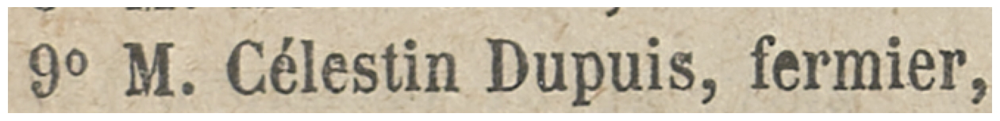

(np.float64(0.5469877739026585), np.float64(0.70703125), np.float64(0.9684538670901413), np.float64(0.7216796875))


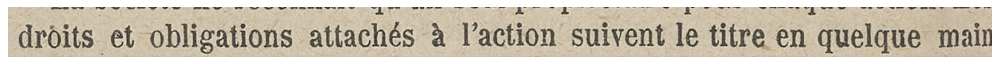

(np.float64(0.12694555265162005), np.float64(0.712890625), np.float64(0.2849953375969261), np.float64(0.7255859375))


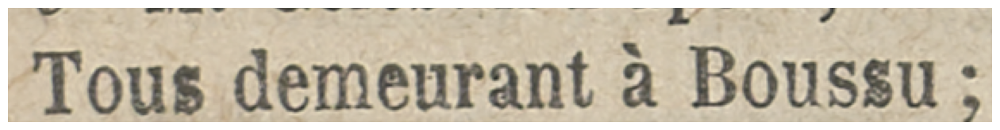

(np.float64(0.5469877739026585), np.float64(0.71875), np.float64(0.9684538670901413), np.float64(0.7333984375))


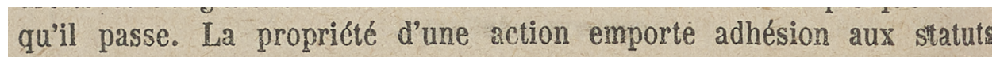

(np.float64(0.12836942458806427), np.float64(0.7255859375), np.float64(0.5370206703475492), np.float64(0.7392578125))


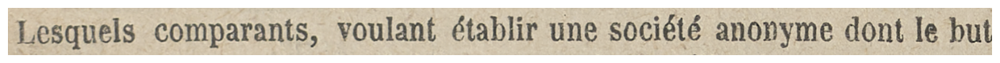

(np.float64(0.5469877739026585), np.float64(0.732421875), np.float64(0.5968232916782055), np.float64(0.7421875))


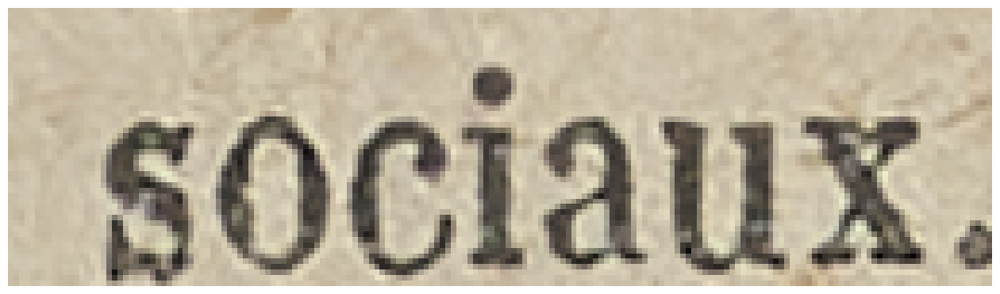

(np.float64(0.11413070522362229), np.float64(0.7353515625), np.float64(0.45016448222445304), np.float64(0.7490234375))


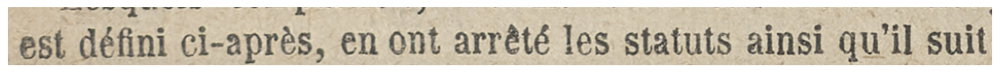

(np.float64(0.5626503652035447), np.float64(0.744140625), np.float64(0.9698777390265854), np.float64(0.7578125))


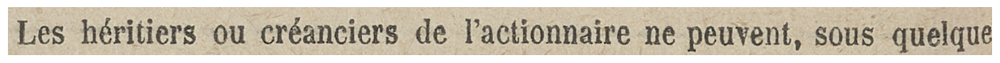

(np.float64(0.16966171074494601), np.float64(0.7548828125), np.float64(0.9698777390265854), np.float64(0.771484375))


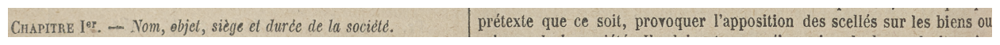

(np.float64(0.5469877739026585), np.float64(0.7666015625), np.float64(0.9698777390265854), np.float64(0.7802734375))


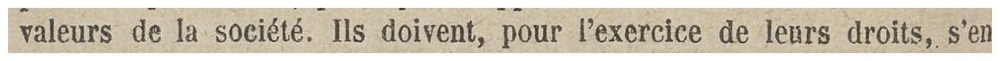

(np.float64(0.12836942458806427), np.float64(0.7761431336402893), np.float64(0.9684538670901413), np.float64(0.7919921875))


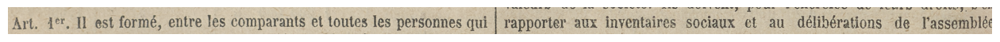

(np.float64(0.11555457716006645), np.float64(0.7868070006370544), np.float64(0.6039426513604265), np.float64(0.8030367493629456))


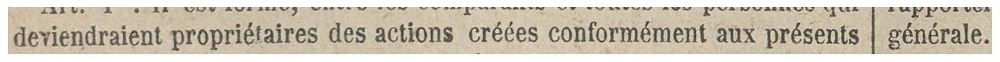

(np.float64(0.11413070522362229), np.float64(0.7998046875), np.float64(0.9698777390265854), np.float64(0.814453125))


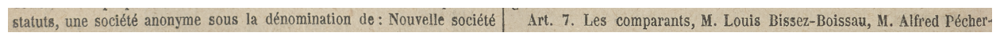

(np.float64(0.11555457716006645), np.float64(0.8103242516517639), np.float64(0.9698777390265854), np.float64(0.8251953125))


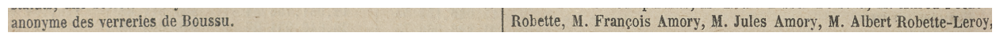

(np.float64(0.12836942458806427), np.float64(0.8212890625), np.float64(0.9713016109630297), np.float64(0.8369140625))


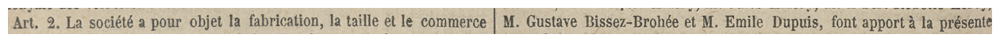

(np.float64(0.11555457716006645), np.float64(0.8330078125), np.float64(0.9713016109630297), np.float64(0.84765625))


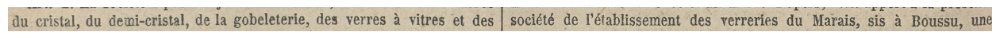

(np.float64(0.11555457716006645), np.float64(0.8435357809066772), np.float64(0.9713016109630297), np.float64(0.859375))


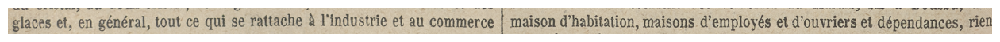

(np.float64(0.11555457716006645), np.float64(0.85546875), np.float64(0.9713016109630297), np.float64(0.869140625))


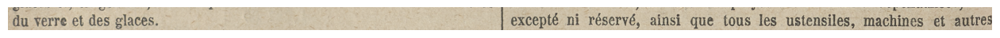

(np.float64(0.12979329652450844), np.float64(0.8671875), np.float64(0.9727254828994738), np.float64(0.880859375))


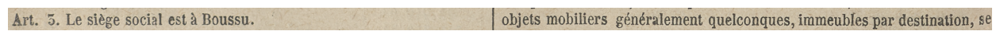

(np.float64(0.12979329652450844), np.float64(0.876953125), np.float64(0.974149354835918), np.float64(0.8935546875))


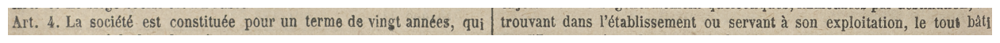

(np.float64(0.11555457716006645), np.float64(0.8896484375), np.float64(0.9727254828994738), np.float64(0.9033203125))


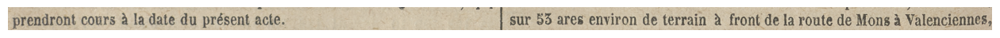

(np.float64(0.13121716846095266), np.float64(0.900390625), np.float64(0.9727254828994738), np.float64(0.9150390625))


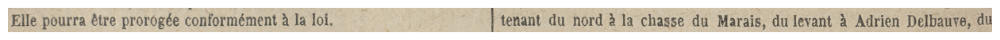

In [ ]:
for line in line_bbox_list:
    print(line)
    pt1 = (int(line[0] * image.shape[1]), int(line[1] * image.shape[0]))
    pt2 = (int(line[2] * image.shape[1]), int(line[3] * image.shape[0]))
    crop = image[pt1[1]:pt2[1], pt1[0]:pt2[0]]
    plt.figure(figsize=(16, 16))
    plt.imshow(cv.cvtColor(crop, cv.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()